In [1]:
import scanpy as sc
import anndata
import logging
import os
import numpy as np
import pandas as pd
import json
# import scanpy.external as sce
logging.basicConfig(level=logging.INFO)

from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

import matplotlib.pyplot as plt
import seaborn as sns
import umap

# from PySpots.fish_helpers import *
from dredFISH.Analysis import basicu
from dredFISH.Analysis import regu
from dredFISH.Analysis import celltypeu
from dredFISH.Analysis import evalu
from dredFISH.Analysis import TissueGraph as tgh

import importlib
importlib.reload(tgh)
importlib.reload(celltypeu)
importlib.reload(evalu)
sc.set_figure_params(figsize=(7, 7))

In [2]:
logging.info('hi')

INFO:root:hi


# file paths and load data

In [3]:
prj_dir = '/bigstore/GeneralStorage/fangming/projects/dredfish/'
dat_dir = prj_dir + 'data/'
res_dir = prj_dir + 'data_dump/'
fig_dir = prj_dir + 'figures/'

input_celltypes = f'{res_dir}noHarmony_March30_v4_isocortex_hpf.csv'
print(input_celltypes)
input_embed1 = f'{res_dir}Joint_UMAP_isocortex_hpf_April1.csv'
print(input_embed1)
input_embed2 = f'{res_dir}Joint_UMAP_isocortex_hpf_subsamp100_level1_April1.csv'
print(input_embed2)
input_embed3 = f'{res_dir}Joint_UMAP_isocortex_hpf_subsamp100_level1_April1_v2.csv'
print(input_embed3)

# dredFISH data
dataset = 'DPNMF_PolyA_2021Nov19' # dataset tag
base_path = '/bigstore/Images2021/gaby/dredFISH/DPNMF_PolyA_2021Nov19/'
fish_path = f'{base_path}fishdata_2022Mar23/' # Zach's new version
# anndata_path = f'{base_path}results/raw_fishdata_Mar30.h5ad'
anndata_path = '/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/DPNMF_PolyA_2021Nov19_v2_results_anndata.h5ad'
# anndata_path = ''

# allen data
scrna_path = '/bigstore/GeneralStorage/fangming/projects/dredfish/data/rna/scrna_ss_ctxhippo_a_exon_DPNMF_matrix.h5ad'

# allen tree
allen_tree_path='/bigstore/GeneralStorage/fangming/reference/allen_ccf/structures.json'


# analysis metadata
meta_path = '/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/analysis_meta_Mar31.json'


/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/noHarmony_March30_v4_isocortex_hpf.csv
/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/Joint_UMAP_isocortex_hpf_April1.csv
/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/Joint_UMAP_isocortex_hpf_subsamp100_level1_April1.csv
/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/Joint_UMAP_isocortex_hpf_subsamp100_level1_April1_v2.csv


In [4]:
%%time

# load dredFISH
TMG = tgh.TissueMultiGraph(name=dataset)
# load raw counts data
if os.path.isfile(anndata_path):
    print('from AnnData')
    TMG.load_from_anndata(anndata_path)
else:
    print('from FishData')
    TMG.load_from_fishdata(fish_path, dataset, output_path=anndata_path)
# normalize (optional for spatial registration)
TMG.normalize_data(norm_cell=True, norm_bit=False)

### for now
data = TMG.data

# print(data)
    
# allen scrna matrix
ref_data = anndata.read_h5ad(scrna_path)
# print(ref_data)

# allen tree
allen_tree, allen_maps = regu.load_allen_tree(allen_tree_path)

# analysis
with open(meta_path, 'r') as fh:
    meta = json.load(fh)


from AnnData


INFO:root:113758 cells, minimum counts = 1248.0


CPU times: user 538 ms, sys: 665 ms, total: 1.2 s
Wall time: 1.22 s


In [5]:
ref_data.obs = ref_data.obs.rename({
                                    'class_label': 'Level_1_class_label',
                                    'neighborhood_label': 'Level_2_neighborhood_label',
                                    'subclass_label': 'Level_3_subclass_label',
                                    'cluster_label': 'Level_5_cluster_label',
                                    }, axis=1)
ref_data

AnnData object with n_obs × n_vars = 73347 × 24
    obs: 'donor_sex_id', 'donor_sex_label', 'donor_sex_color', 'region_id', 'region_label', 'region_color', 'platform_label', 'cluster_order', 'Level_5_cluster_label', 'cluster_color', 'subclass_order', 'Level_3_subclass_label', 'subclass_color', 'neighborhood_id', 'Level_2_neighborhood_label', 'neighborhood_color', 'class_order', 'Level_1_class_label', 'class_color', 'exp_component_name', 'external_donor_name_label', 'full_genotype_label', 'facs_population_plan_label', 'injection_roi_label', 'injection_materials_label', 'injection_method_label', 'injection_type_label', 'full_genotype_id', 'full_genotype_color', 'external_donor_name_id', 'external_donor_name_color', 'facs_population_plan_id', 'facs_population_plan_color', 'injection_materials_id', 'injection_materials_color', 'injection_method_id', 'injection_method_color', 'injection_roi_id', 'injection_roi_color', 'injection_type_id', 'injection_type_color', 'cell_type_accession_label',

In [6]:
# select specific regions
selected_regions = ['Isocortex', 'HPF']
selected_all_sids = regu.expand_regions(allen_tree, selected_regions, 'acronym')

# selected cells
cond_cells = data.obs['region_id'].isin(selected_all_sids)
data = data[cond_cells]
data

View of AnnData object with n_obs × n_vars = 44075 × 24
    obs: 'label', 'pixel_x', 'pixel_y', 'nuclei_size', 'nuclei_signal', 'cytoplasm_size', 'cytoplasm_signal', 'total_size', 'total_signal', 'posname', 'posname_stage_x', 'posname_stage_y', 'cell_name', 'stage_x', 'stage_y', 'coord_x', 'coord_y', 'region_id', 'region_color', 'region_acronym'
    obsm: 'stage'
    layers: 'cytoplasm_vectors', 'nuclei_vectors', 'total_vectors', 'norm_cell'

In [7]:
# results
dftypes = pd.read_csv(input_celltypes, index_col=0)
dftypes = dftypes.filter(regex=r'^Level_[0-9]', axis=1)
levels = dftypes.columns.values

# update data
data.obs = data.obs.join(dftypes)

# update the joint one
dfembed1 = pd.read_csv(input_embed1, index_col=0)
dfembed2 = pd.read_csv(input_embed2, index_col=0)
dfembed3 = pd.read_csv(input_embed3, index_col=0)
dfembed1 = dfembed1.join(pd.concat([data.obs, ref_data.obs]))
dfembed2 = dfembed2.join(pd.concat([data.obs, ref_data.obs]))
dfembed3 = dfembed3.join(pd.concat([data.obs, ref_data.obs]))

print(dftypes.shape, dfembed1.shape, dfembed2.shape, dfembed3.shape, data.obs.shape)

(44075, 3) (117422, 79) (44375, 79) (44375, 79) (44075, 23)


# Organize information

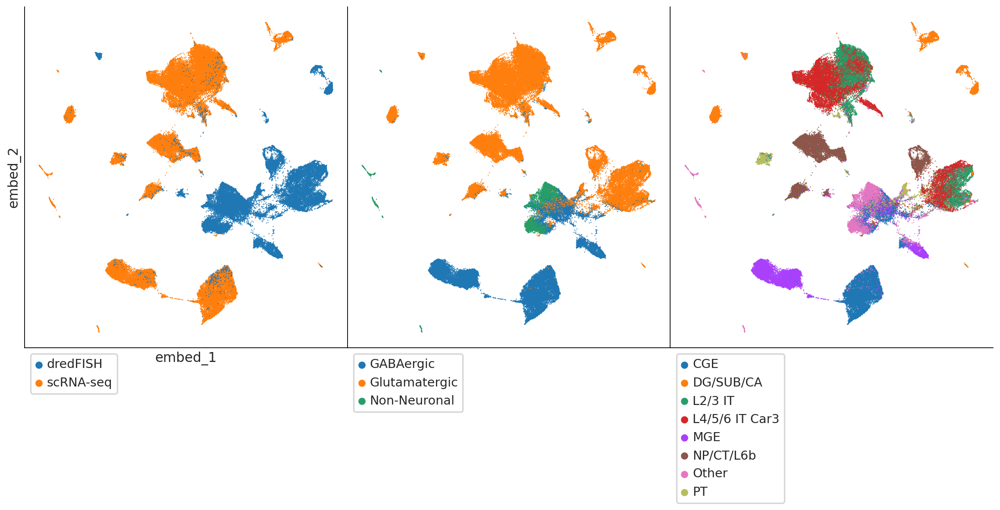

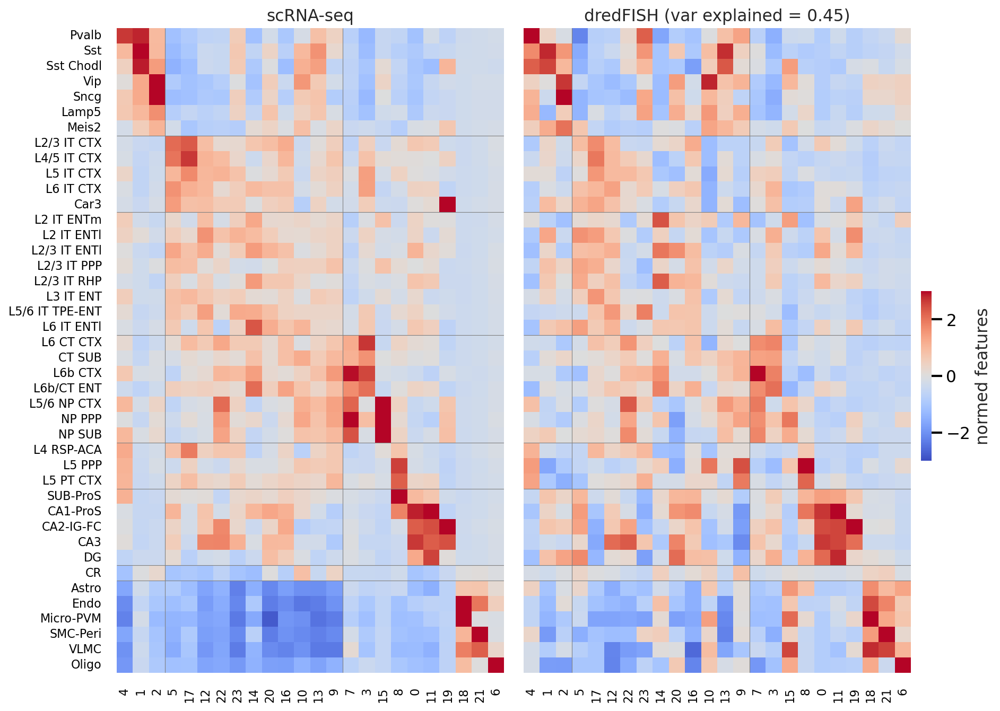

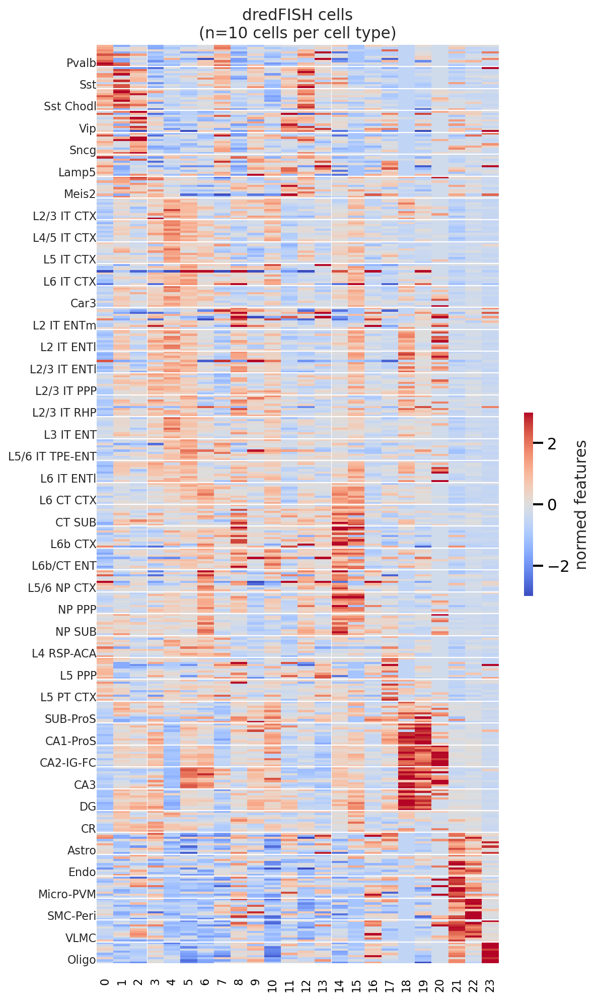

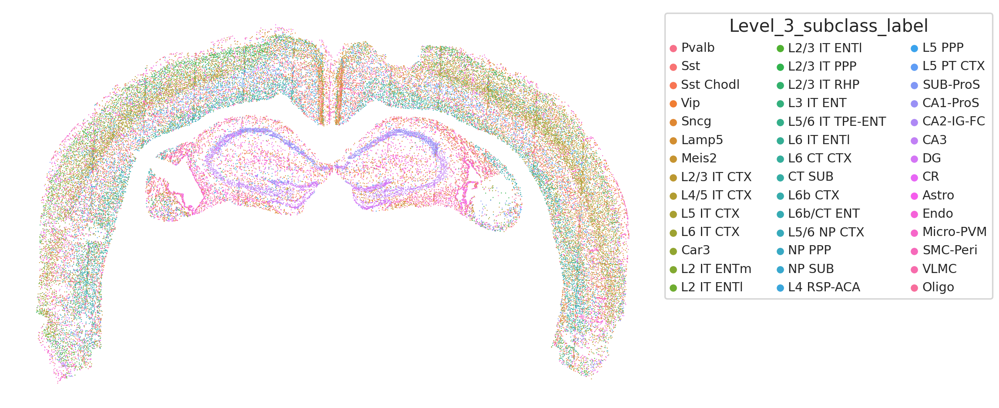

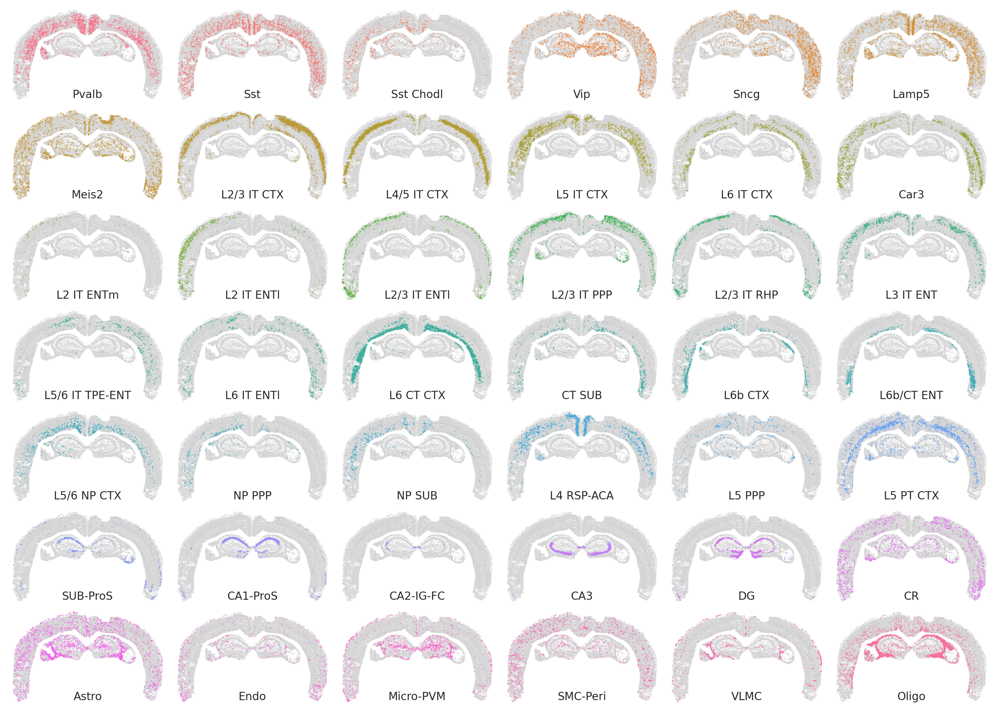

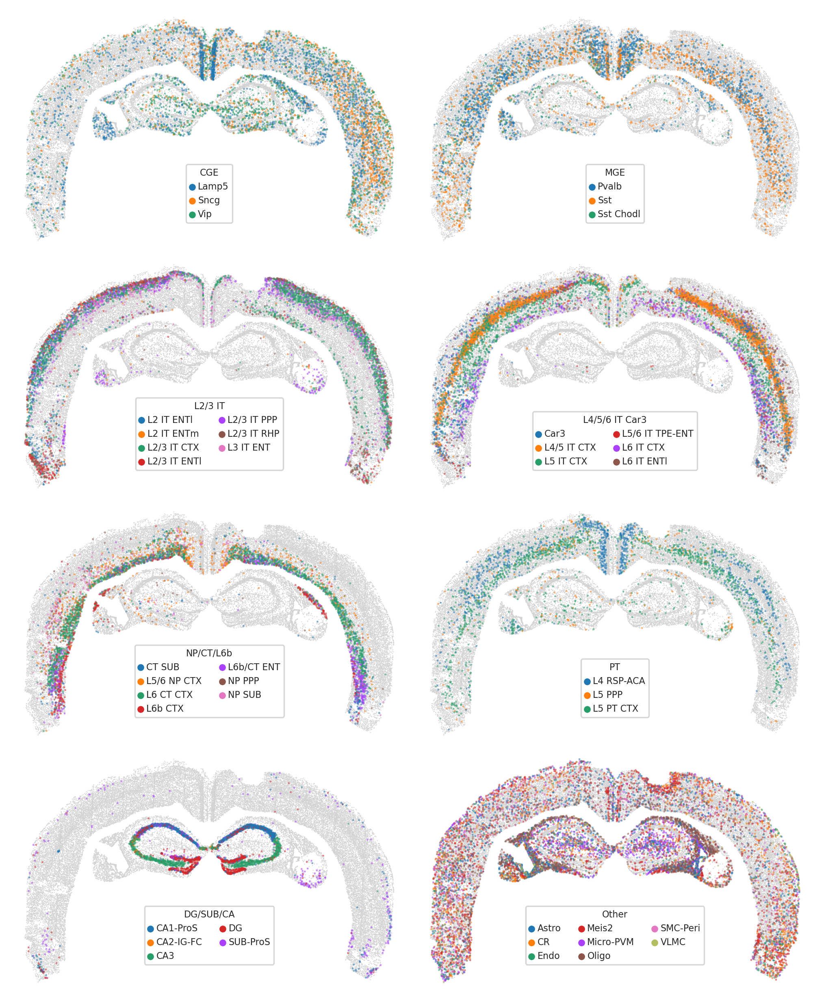

In [8]:
res = evalu.Level3Res(meta, levels, 
                ref_data, data, 
                refdata_name='scRNA-seq', data_name='dredFISH',
                embed=True, df_embed=dfembed1,
               )

# embed eval
res.plot_embeds(hues=['dataset']+levels[:2].tolist())

# gene eval
res.plot_genes()

# spatial eval
res.plot_spatial()


In [9]:
def plot_highlight(ax, df, col, catg, color):
    """
    """
    cond = (df[col] == catg)
    sns.scatterplot(
        data=df, 
        x='embed_1',
        y='embed_2',
        # hue='Level_1_class_label',
        color='lightgray',
        edgecolor='none',
        s=1,
        ax=ax,
    )
    sns.scatterplot(
        data=df[cond], 
        x='embed_1',
        y='embed_2',
        # hue='Level_1_class_label',
        color=color,
        edgecolor='none',
        s=3,
        ax=ax,
    )
    ax.set_aspect('equal')
    sns.despine(ax=ax)
    ax.set_xticks([])
    ax.set_yticks([])

    ax.set_title(catg)
    
def plot_highlight_hue(ax, df, col, catg, hue):
    """
    """
    cond = (df[col] == catg)
    sns.scatterplot(
        data=df, 
        x='embed_1',
        y='embed_2',
        # hue='Level_1_class_label',
        color='lightgray',
        edgecolor='none',
        s=1,
        ax=ax,
    )
    
    hue_order = np.sort(np.unique(df[cond][hue]))
    nums = len(hue_order) 
    sns.scatterplot(
        data=df[cond], 
        x='embed_1',
        y='embed_2',
        hue=hue,
        hue_order=hue_order,
        # color=color,
        edgecolor='none',
        s=3,
        ax=ax,
    )
    ax.set_aspect('equal')
    sns.despine(ax=ax)
    ax.set_xticks([])
    ax.set_yticks([])

    ax.set_title(catg)
    ax.legend(bbox_to_anchor=(0,0), loc='upper left', ncol=1+int(nums/10))

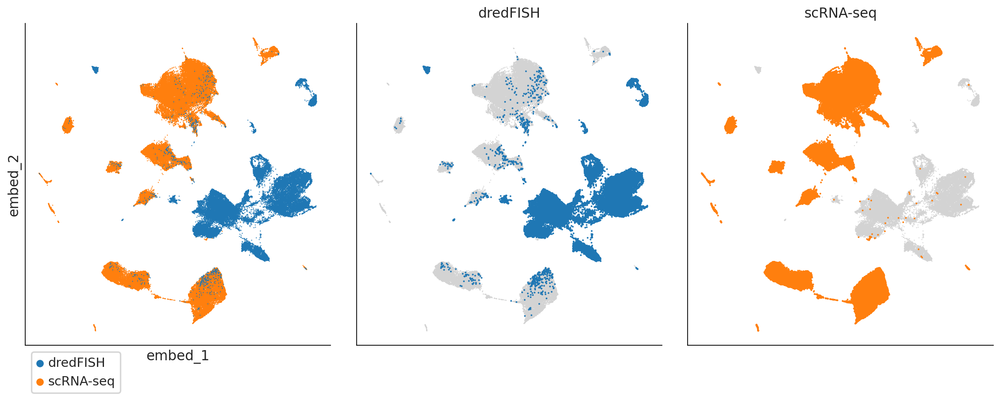

In [10]:
fig, axs = plt.subplots(1,3, figsize=(6*3, 6), sharex=True, sharey=True)
ax = axs[0]
evalu.plot_embed(ax, dfembed1, 'dataset')
ax = axs[1]
plot_highlight(ax, dfembed1, 'dataset', 'dredFISH', 'C0')
ax = axs[2]
plot_highlight(ax, dfembed1, 'dataset', 'scRNA-seq', 'C1')
fig.subplots_adjust(wspace=0)
plt.show()

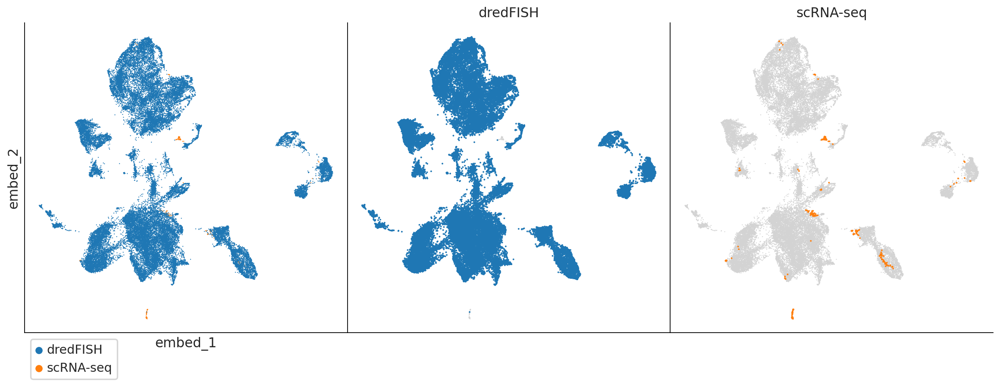

In [11]:
fig, axs = plt.subplots(1,3, figsize=(6*3, 6), sharex=True, sharey=True)
ax = axs[0]
evalu.plot_embed(ax, dfembed2, 'dataset')
ax = axs[1]
plot_highlight(ax, dfembed2, 'dataset', 'dredFISH', 'C0')
ax = axs[2]
plot_highlight(ax, dfembed2, 'dataset', 'scRNA-seq', 'C1')
fig.subplots_adjust(wspace=0)
plt.show()

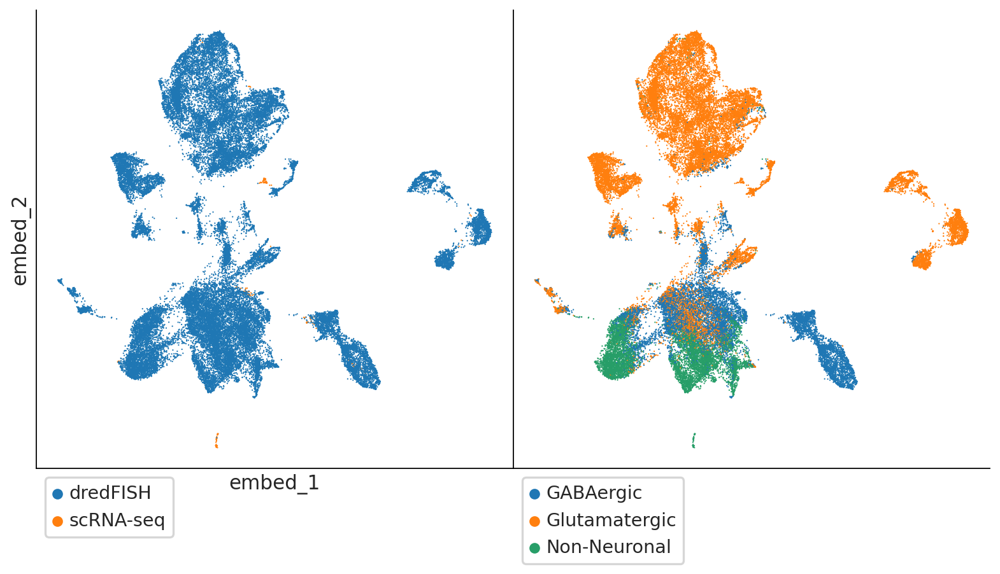

In [12]:
res = evalu.Level3Res(meta, levels, 
                ref_data, data, 
                refdata_name='scRNA-seq', data_name='dredFISH',
                embed=True, df_embed=dfembed2,
               )

# embed eval
res.plot_embeds(hues=['dataset']+levels[:1].tolist())

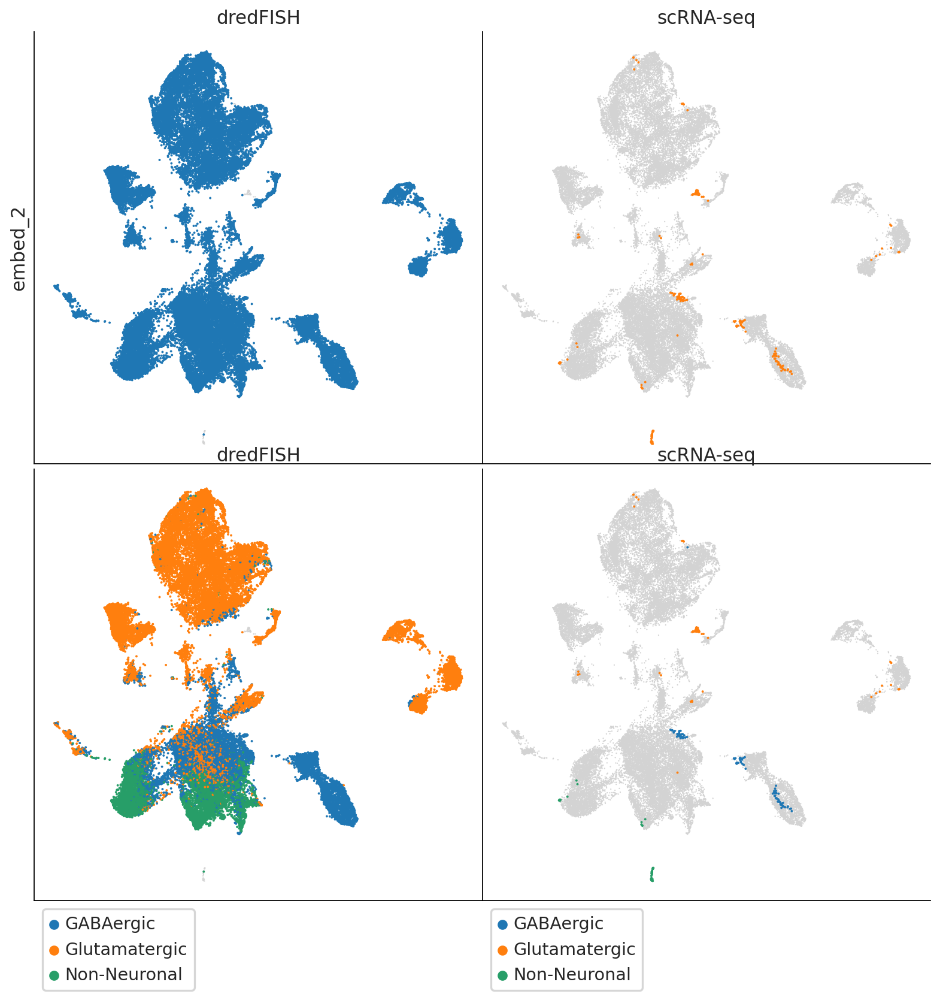

In [13]:
fig, axs = plt.subplots(2,2, figsize=(6*2, 6*2), sharex=True, sharey=True)
axs = axs.flat
ax = axs[0]
plot_highlight(ax, dfembed2, 'dataset', 'dredFISH', 'C0')
ax = axs[1]
plot_highlight(ax, dfembed2, 'dataset', 'scRNA-seq', 'C1')
ax = axs[2]
plot_highlight_hue(ax, dfembed2, 'dataset', 'dredFISH', 'Level_1_class_label')
ax = axs[3]
plot_highlight_hue(ax, dfembed2, 'dataset', 'scRNA-seq', 'Level_1_class_label')
fig.subplots_adjust(wspace=0, hspace=0)
plt.show()

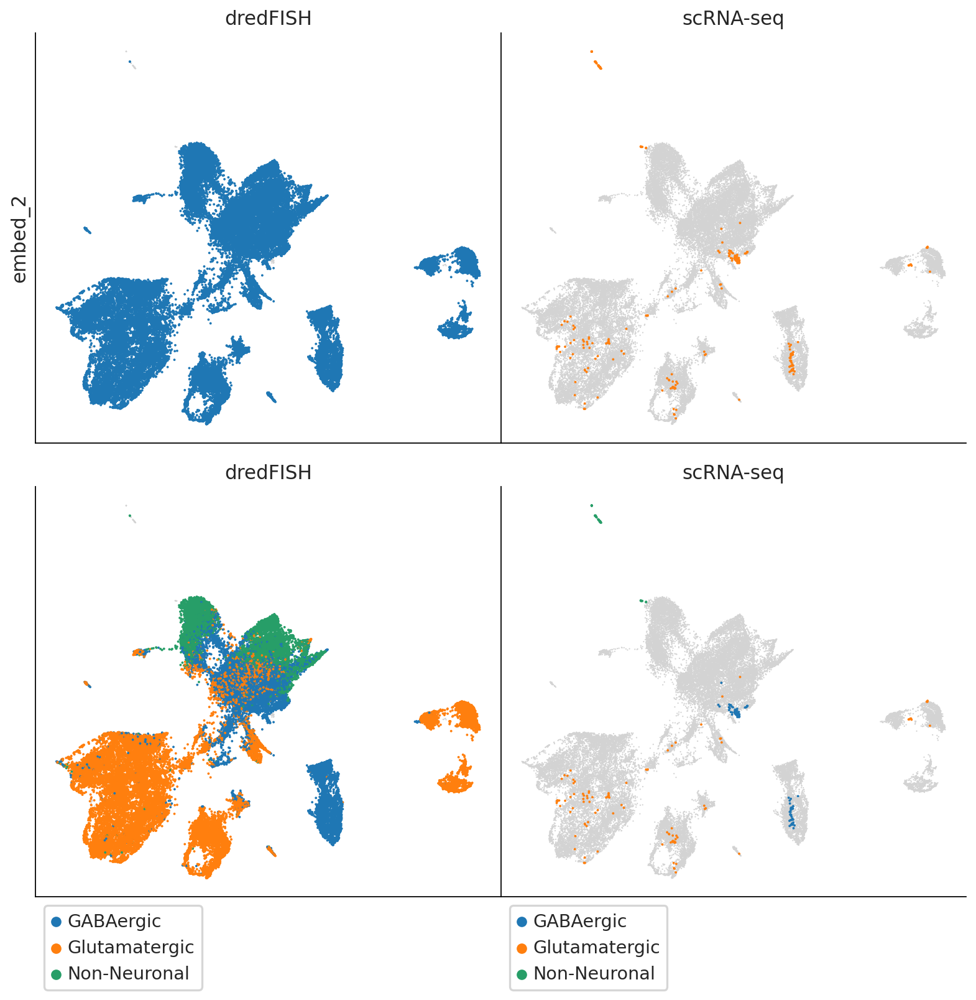

In [14]:
fig, axs = plt.subplots(2,2, figsize=(6*2, 6*2), sharex=True, sharey=True)
axs = axs.flat
ax = axs[0]
plot_highlight(ax, dfembed3, 'dataset', 'dredFISH', 'C0')
ax = axs[1]
plot_highlight(ax, dfembed3, 'dataset', 'scRNA-seq', 'C1')
ax = axs[2]
plot_highlight_hue(ax, dfembed3, 'dataset', 'dredFISH', 'Level_1_class_label')
ax = axs[3]
plot_highlight_hue(ax, dfembed3, 'dataset', 'scRNA-seq', 'Level_1_class_label')
fig.subplots_adjust(wspace=0, hspace=0)
plt.show()